In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
df=pd.read_csv("regression_data.csv")
df.head()

,1,60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,...,0.8,NA.2,NA.3,NA.4,0.9,2.2,2008,WD,Normal,208500
0,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
1,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
2,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
3,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
4,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000


In [24]:
num_features=df.select_dtypes(include=np.number).columns
cat_features=df.select_dtypes(exclude=np.number).columns.tolist()

In [23]:
num_features

Index(['1', '60', '65', '8450', '7', '5', '2003', '2003.1', '196', '706', '0',
       '150', '856', '856.1', '854', '0.1', '1710', '1.1', '0.2', '2', '1.2',
       '3', '1.3', '8', '0.3', '2003.2', '2.1', '548', '0.4', '61', '0.5',
       '0.6', '0.7', '0.8', '0.9', '2.2', '2008', '208500'],
      dtype='object')

In [25]:
cat_features

['RL',
 'Pave',
 'NA',
 'Reg',
 'Lvl',
 'AllPub',
 'Inside',
 'Gtl',
 'CollgCr',
 'Norm',
 'Norm.1',
 '1Fam',
 '2Story',
 'Gable',
 'CompShg',
 'VinylSd',
 'VinylSd.1',
 'BrkFace',
 'Gd',
 'TA',
 'PConc',
 'Gd.1',
 'TA.1',
 'No',
 'GLQ',
 'Unf',
 'GasA',
 'Ex',
 'Y',
 'SBrkr',
 'Gd.2',
 'Typ',
 'NA.1',
 'Attchd',
 'RFn',
 'TA.2',
 'TA.3',
 'Y.1',
 'NA.2',
 'NA.3',
 'NA.4',
 'WD',
 'Normal']

In [26]:
sns.pairplot(df[num_features])

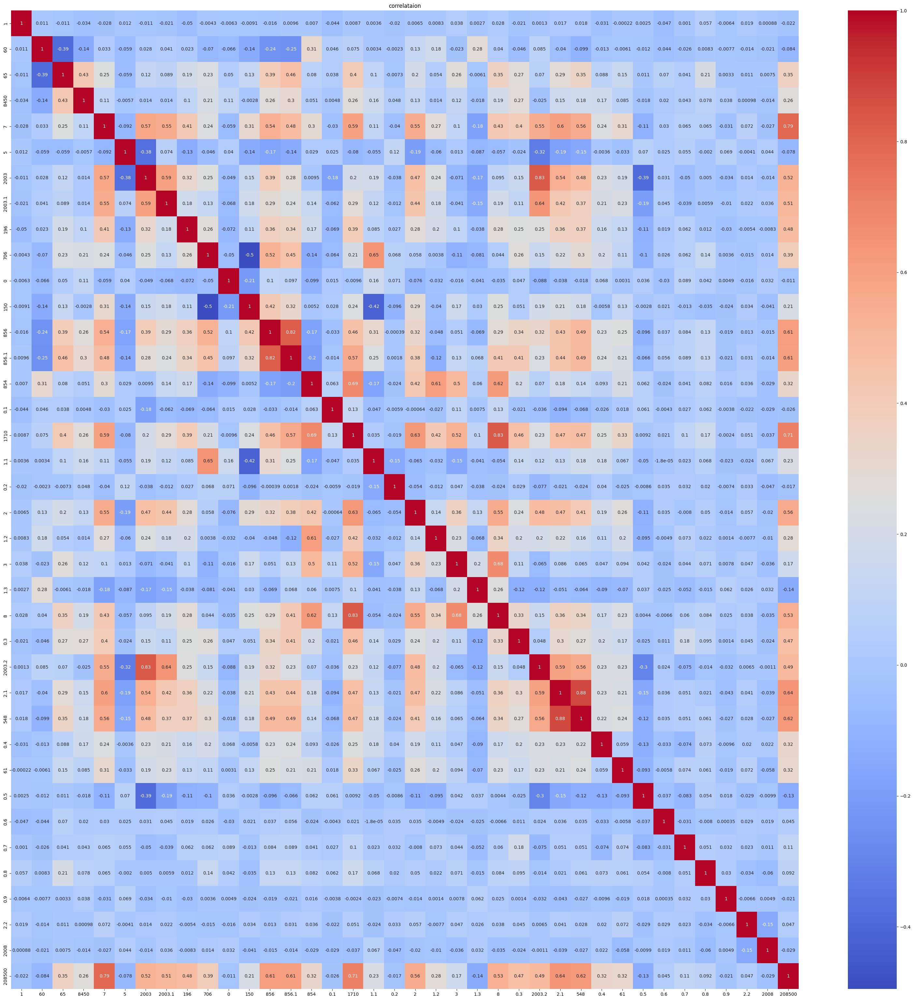

In [33]:
plt.figure(figsize=(39,39))
plt.title("correlataion")

sns.heatmap(df[num_features].corr(),annot=True ,cmap="coolwarm")
plt.show()

In [38]:
cormat=df[num_features].corr()['208500'].abs()
low_corr_features = cormat[cormat < 0.3].index.tolist()
low_corr_features = [f for f in low_corr_features if f != '208500']

print("Features with low correlation to target:", low_corr_features)
df_new = df.drop(low_corr_features, axis=1)
df_new.head()

Features with low correlation to target: ['1', '60', '8450', '5', '0', '150', '0.1', '1.1', '0.2', '1.2', '3', '1.3', '0.5', '0.6', '0.7', '0.8', '0.9', '2.2', '2008']


,RL,65,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,...,TA.3,Y.1,0.4,61,NA.2,NA.3,NA.4,WD,Normal,208500
0,RL,80.0,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,...,TA,Y,298,0,NaN,NaN,NaN,WD,Normal,181500
1,RL,68.0,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,...,TA,Y,0,42,NaN,NaN,NaN,WD,Normal,223500
2,RL,60.0,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,...,TA,Y,0,35,NaN,NaN,NaN,WD,Abnorml,140000
3,RL,84.0,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,...,TA,Y,192,84,NaN,NaN,NaN,WD,Normal,250000
4,RL,85.0,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,...,TA,Y,40,30,NaN,MnPrv,Shed,WD,Normal,143000


In [51]:
df[cat_features].nunique()

,0
RL,5
Pave,2
NA,2
Reg,4
Lvl,4
AllPub,2
Inside,5
Gtl,3
CollgCr,25
Norm,9


In [56]:
from sklearn.preprocessing import LabelEncoder
l_en=LabelEncoder()
newcat_df=pd.DataFrame()
for i in cat_features:
    newcat_df[i]=l_en.fit_transform(df[i])
newcat_df=pd.concat([newcat_df ,df['208500']], axis=1 )
newcat_df.head()

,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,RFn,TA.2,TA.3,Y.1,NA.2,NA.3,NA.4,WD,Normal,208500
0,3,1,2,3,3,0,2,0,24,1,...,1,4,4,2,3,4,4,8,4,181500
1,3,1,2,0,3,0,4,0,5,2,...,1,4,4,2,3,4,4,8,4,223500
2,3,1,2,0,3,0,0,0,6,2,...,2,4,4,2,3,4,4,8,0,140000
3,3,1,2,0,3,0,2,0,15,2,...,1,4,4,2,3,4,4,8,4,250000
4,3,1,2,0,3,0,4,0,11,2,...,2,4,4,2,3,2,2,8,4,143000


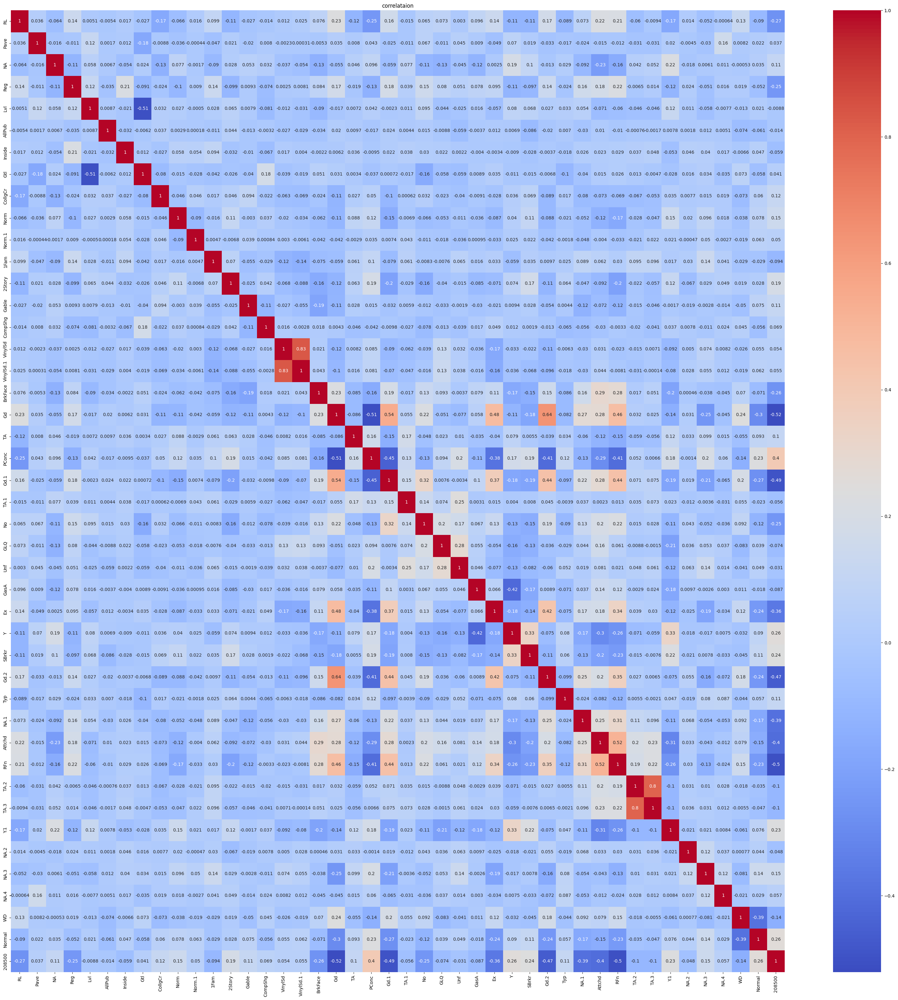

In [65]:
plt.figure(figsize=(39,39))
plt.title("correlataion")

sns.heatmap(newcat_df[cat_features+["208500"]].corr(method="kendall"),annot=True ,cmap="coolwarm")
plt.show()

In [69]:
corm_cat=newcat_df[cat_features+["208500"]].corr(method="kendall")['208500'].abs()
low_corr_features = corm_cat[corm_cat < 0.3].index.tolist()
low_corr_features = [f for f in low_corr_features if f != '208500']

#print("Features with low correlation to target:", low_corr_features)
df_catnew = newcat_df.drop(low_corr_features, axis=1)
df_catnew.drop(['208500'], axis=1, inplace=True)
df_catnew.head()

,Gd,PConc,Gd.1,Ex,Gd.2,NA.1,Attchd,RFn
0,3,1,2,0,3,4,1,1
1,2,2,2,0,2,4,1,1
2,3,0,3,2,2,2,5,2
3,2,2,2,0,2,4,1,1
4,3,5,2,0,3,5,1,2


In [78]:
removed_fea=['1', '60', '8450', '5', '0', '150', '0.1', '1.1', '0.2', '1.2', '3', '1.3', '0.5', '0.6', '0.7', '0.8', '0.9', '2.2', '2008']
remain_reat=[i for i in num_features if i not in removed_fea]


df_after_dimred=pd.concat([ df_catnew,df_new[remain_reat]], axis=1)
df_after_dimred.head()


,Gd,PConc,Gd.1,Ex,Gd.2,NA.1,Attchd,RFn,65,7,...,1710,2,8,0.3,2003.2,2.1,548,0.4,61,208500
0,3,1,2,0,3,4,1,1,80.0,6,...,1262,2,6,1,1976.0,2,460,298,0,181500
1,2,2,2,0,2,4,1,1,68.0,7,...,1786,2,6,1,2001.0,2,608,0,42,223500
2,3,0,3,2,2,2,5,2,60.0,7,...,1717,1,7,1,1998.0,3,642,0,35,140000
3,2,2,2,0,2,4,1,1,84.0,8,...,2198,2,9,1,2000.0,3,836,192,84,250000
4,3,5,2,0,3,5,1,2,85.0,5,...,1362,1,5,0,1993.0,2,480,40,30,143000


In [79]:
df_after_dimred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Gd      1459 non-null   int64  
 1   PConc   1459 non-null   int64  
 2   Gd.1    1459 non-null   int64  
 3   Ex      1459 non-null   int64  
 4   Gd.2    1459 non-null   int64  
 5   NA.1    1459 non-null   int64  
 6   Attchd  1459 non-null   int64  
 7   RFn     1459 non-null   int64  
 8   65      1200 non-null   float64
 9   7       1459 non-null   int64  
 10  2003    1459 non-null   int64  
 11  2003.1  1459 non-null   int64  
 12  196     1451 non-null   float64
 13  706     1459 non-null   int64  
 14  856     1459 non-null   int64  
 15  856.1   1459 non-null   int64  
 16  854     1459 non-null   int64  
 17  1710    1459 non-null   int64  
 18  2       1459 non-null   int64  
 19  8       1459 non-null   int64  
 20  0.3     1459 non-null   int64  
 21  2003.2  1378 non-null   float64
 22  

In [82]:
df_after_dimred['65']=df_after_dimred['65'].fillna(df_after_dimred['65'].median())
df_after_dimred['2003.2']=df_after_dimred['2003.2'].fillna(df_after_dimred['2003.2'].median())
df_after_dimred.dropna(subset=["196"] ,inplace=True)
df_after_dimred.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1451 entries, 0 to 1458
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Gd      1451 non-null   int64  
 1   PConc   1451 non-null   int64  
 2   Gd.1    1451 non-null   int64  
 3   Ex      1451 non-null   int64  
 4   Gd.2    1451 non-null   int64  
 5   NA.1    1451 non-null   int64  
 6   Attchd  1451 non-null   int64  
 7   RFn     1451 non-null   int64  
 8   65      1451 non-null   float64
 9   7       1451 non-null   int64  
 10  2003    1451 non-null   int64  
 11  2003.1  1451 non-null   int64  
 12  196     1451 non-null   float64
 13  706     1451 non-null   int64  
 14  856     1451 non-null   int64  
 15  856.1   1451 non-null   int64  
 16  854     1451 non-null   int64  
 17  1710    1451 non-null   int64  
 18  2       1451 non-null   int64  
 19  8       1451 non-null   int64  
 20  0.3     1451 non-null   int64  
 21  2003.2  1451 non-null   float64
 22  2.1  

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 81 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   1          1459 non-null   int64  
 1   60         1459 non-null   int64  
 2   RL         1459 non-null   object 
 3   65         1200 non-null   float64
 4   8450       1459 non-null   int64  
 5   Pave       1459 non-null   object 
 6   NA         91 non-null     object 
 7   Reg        1459 non-null   object 
 8   Lvl        1459 non-null   object 
 9   AllPub     1459 non-null   object 
 10  Inside     1459 non-null   object 
 11  Gtl        1459 non-null   object 
 12  CollgCr    1459 non-null   object 
 13  Norm       1459 non-null   object 
 14  Norm.1     1459 non-null   object 
 15  1Fam       1459 non-null   object 
 16  2Story     1459 non-null   object 
 17  7          1459 non-null   int64  
 18  5          1459 non-null   int64  
 19  2003       1459 non-null   int64  
 20  2003.1  

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
1,1459.0,731.000000,421.321334,2.0,366.5,731.0,1095.5,1460.0
60,1459.0,56.895134,42.314997,20.0,20.0,50.0,70.0,190.0
65,1200.0,70.054167,24.294439,21.0,59.0,69.5,80.0,313.0
8450,1459.0,10518.244688,9984.540455,1300.0,7549.0,9480.0,11603.0,215245.0
7,1459.0,6.098698,1.383270,1.0,5.0,6.0,7.0,10.0
5,1459.0,5.575737,1.113079,1.0,5.0,5.0,6.0,9.0
2003,1459.0,1971.246059,30.201821,1872.0,1954.0,1973.0,2000.0,2010.0
2003.1,1459.0,1984.853324,20.647021,1950.0,1967.0,1994.0,2004.0,2010.0
196,1451.0,103.621640,181.112397,0.0,0.0,0.0,165.5,1600.0
706,1459.0,443.459904,456.202701,0.0,0.0,383.0,712.5,5644.0


In [114]:
def cap_outliers_iqr(data, feature):
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data[feature] = np.where(data[feature] < lower_bound, lower_bound,
                     np.where(data[feature] > upper_bound, upper_bound, data[feature]))
    return data
df_after_outlier=pd.DataFrame()
remain_reatwithoutTarget=remain_reat.pop()
# Apply capping to all numeric features (except target)
for col in remain_reat:
    print(col)
    df_after_outlier = cap_outliers_iqr(df_after_dimred, col)

65
7
2003
2003.1
196
706
856
856.1
854
1710
2
8
0.3
2003.2
2.1
548
0.4
61


In [113]:
def detect_outliers_iqr(data, feature):
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)]
    return outliers

# Check outliers in each numerical column
for col in remain_reat:
    outliers = detect_outliers_iqr(df_after_dimred, col)
    print(f"{col}: {len(outliers)} outliers")

65: 0 outliers
7: 0 outliers
2003: 0 outliers
2003.1: 0 outliers
196: 0 outliers
706: 0 outliers
856: 0 outliers
856.1: 0 outliers
854: 0 outliers
1710: 0 outliers
2: 0 outliers
8: 0 outliers
0.3: 0 outliers
2003.2: 0 outliers
2.1: 0 outliers
548: 0 outliers
0.4: 0 outliers
61: 0 outliers
208500: 0 outliers


In [115]:
x=df_after_outlier[df_after_dimred.columns.tolist()[:-1]]
y=df_after_outlier["208500"]

In [123]:
y

,208500
0,181500.0
1,223500.0
2,140000.0
3,250000.0
4,143000.0
...,...
1454,175000.0
1455,210000.0
1456,266500.0
1457,142125.0


In [116]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [93]:
"""plt.figure(figsize=(15, 10))
for i, col in enumerate(remain_reat, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=x[col], color='skyblue')
    plt.title(f'Box Plot - {col}')
plt.tight_layout()
plt.show()"""

"plt.figure(figsize=(15, 10))\nfor i, col in enumerate(remain_reat, 1):\n    plt.subplot(3, 3, i)\n    sns.boxplot(y=x[col], color='skyblue')\n    plt.title(f'Box Plot - {col}')\nplt.tight_layout()\nplt.show()"

In [108]:
from sklearn.preprocessing import MinMaxScaler #didn't affect overall acc
sc=MinMaxScaler()
x_train=sc.fit_transform(x_train)
x_test=sc.transform(x_test)

In [117]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

lr=LinearRegression()
lr.fit(x_train,y_train)
y_pred=lr.predict(x_test)
print(r2_score(y_test,y_pred))

print(mean_squared_error(y_test,y_pred)) # why number is huge?

0.881945391017287
449779631.4872643


In [120]:
from sklearn.preprocessing import PolynomialFeatures
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Train Linear Regression on polynomial features
model = LinearRegression()
model.fit(X_train_poly, y_train)

# Predict
y_pred = model.predict(X_test_poly)

# Evaluate
r2 = r2_score(y_test, y_pred)
print("R² score:", r2)

R² score: 0.8139631963060688


In [131]:
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Polynomial features
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Scale features (important for regularization)
scaler = StandardScaler()
X_train_poly = scaler.fit_transform(X_train_poly)
X_test_poly = scaler.transform(X_test_poly)

# Ridge Regression
ridge = Ridge(alpha=1.0)   # alpha = strength of regularization
ridge.fit(X_train_poly, y_train)
ridge_pred = ridge.predict(X_test_poly)

# Lasso Regression
lasso = Lasso(alpha=0.01)  # small alpha to avoid underfitting
lasso.fit(X_train_poly, y_train)
lasso_pred = lasso.predict(X_test_poly)

# Evaluate
print("Ridge R²:", r2_score(y_test, ridge_pred))
print("Lasso R²:", r2_score(y_test, lasso_pred))

Ridge R²: 0.8528498053403355
Lasso R²: 0.8451657090196818


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.868e+11, tolerance: 5.408e+08
  model = cd_fast.enet_coordinate_descent(
